# Align two MERFISH brain sections using modified LDDMM with both cell density and gene exp for select DEGs and all genes.
#### Version: Using automated landmark points. 

Data source: Vizgen Data Release V1.0. May 2021 (https://info.vizgen.com/mouse-brain-map?submissionGuid=955163f1-3119-42d9-bcbf-e0255e6e7d17) 

Dataset used: Slice 2 Replicate 2, Slice 2 Replicate 3 

Code: Iris Kwon (skwon38@jh.edu)

In [1]:
import STalign
# from STalign import STalign
dir(STalign)
import os
import matplotlib.pyplot as plt
##### %%time
import torch
import copy
from torch.nn.functional import grid_sample
import pandas as pd
import scanpy as sc
import numpy as np
import anndata as ad 

### 00. Define functions for STalign2

In [2]:
def normalize(arr, t_min=0, t_max=1):
    """Linearly normalizes an array between two specifed values.
    
    Parameters
    ----------
    arr : numpy array
        array to be normalized
    t_min : int or float
        Lower bound of normalization range
    t_max : int or float
        Upper bound of normalization range
    
    Returns
    -------
    norm_arr : numpy array
        1D array with normalized arr values
        
    """
    
    diff = t_max - t_min
    diff_arr = np.max(arr) - np.min(arr)
    min_ = np.min(arr)
    if diff_arr != 0:
        norm_arr = ((arr - min_)/diff_arr * diff) + t_min
    else:
        norm_arr = np.zeros(arr.shape)
    
    return norm_arr


def rasterize(x, y, g=np.ones(1), dx=15, blur=1.5, expand=1.2, draw=0, wavelet_magnitude=False,use_windowing=True):
    ''' Rasterize a spatial transcriptomics dataset into a density image
    
    Paramters
    ---------
    x : numpy array of length N
        x location of cells
    y : numpy array of length N
        y location of cells
    g : numpy array of length N
        RNA count of cells
        If not given, density image is created
    dx : float
        Pixel size to rasterize data (default 30.0, in same units as x and y)
    blur : float or list of floats
        Standard deviation of Gaussian interpolation kernel.  Units are in 
        number of pixels.  Can be aUse a list to do multi scale.
    expand : float
        Factor to expand sampled area beyond cells. Defaults to 1.1.
    draw : int
        If True, draw a figure every draw points return its handle. Defaults to False (0).
    wavelet_magnitude : bool
        If True, take the absolute value of difference between scales for raster images.
        When using this option blur should be sorted from greatest to least.
    
        
    Returns
    -------
    X  : numpy array
        Locations of pixels along the x axis
    Y  : numpy array
        Locations of pixels along the y axis
    M : numpy array
        A rasterized image with len(blur) channels along the first axis
    fig : matplotlib figure handle
        If draw=True, returns a figure handle to the drawn figure.
        
    Raises
    ------    
    Exception 
        If wavelet_magnitude is set to true but blur is not sorted from greatest to least.
        
        
    
    Examples
    --------
    Rasterize a dataset at 30 micron pixel size, with three kernels.
    
    >>> X,Y,M,fig = tools.rasterize(x,y,dx=30.0,blur=[2.0,1.0,0.5],draw=10000)
    
    Rasterize a dataset at 30 micron pixel size, with three kernels, using difference between scales.
    
    >>> X,Y,M,fig = tools.rasterize(x,y,dx=30.0,blur=[2.0,1.0,0.5],draw=10000, wavelet_magnitude=True)
        
        
    '''
    
    # set blur to a list
    if not isinstance(blur,list):
        blur = [blur]
    nb = len(blur)
    blur = np.array(blur)
    n = len(x)
    maxblur = np.max(blur) # for windowing
    
    
    
    if wavelet_magnitude and np.any(blur != np.sort(blur)[::-1]):
        raise Exception('When using wavelet magnitude, blurs must be sorted from greatest to least')
    
    minx = np.min(x)
    maxx = np.max(x)
    miny = np.min(y)
    maxy = np.max(y)
    minx,maxx = (minx+maxx)/2.0 - (maxx-minx)/2.0*expand, (minx+maxx)/2.0 + (maxx-minx)/2.0*expand
    miny,maxy = (miny+maxy)/2.0 - (maxy-miny)/2.0*expand, (miny+maxy)/2.0 + (maxy-miny)/2.0*expand
    X_ = np.arange(minx,maxx,dx)
    Y_ = np.arange(miny,maxy,dx)
    
    X = np.stack(np.meshgrid(X_,Y_)) # note this is xy order, not row col order

    W = np.zeros((X.shape[1],X.shape[2],nb))

    
    if draw: fig,ax = plt.subplots()
    count = 0
    
    g = np.resize(g,x.size)
    if(not (g==1.0).all()):
        g = normalize(g)
    #if np.sum(g) == 0:
    #    print('no gene exp')
    #    return X,Y,W, None
    for x_,y_,g_ in zip(x,y,g):
        # to speed things up I should index
        # to do this I'd have to find row and column indices
        #col = np.round((x_ - X_[0])/dx).astype(int)
        #row = np.round((y_ - X_[1])/dx).astype(int)
        #row0 = np.floor(row-blur*3).astype(int)
        #row1 = np.ceil(row+blur*3).astype(int)        
        #rows = np.arange(row0,row1+1)
        

        # this is incrementing one pixel at a time, it is way way faster, 
        # but doesn't use a kernel
        # I[c_,row,col] += 1.0
        # W[row,col] += 1.0
        if not use_windowing: # legacy version
            k = np.exp( - ( (X[0][...,None] - x_)**2 + (X[1][...,None] - y_)**2 )/(2.0*(dx*blur*2)**2)  )
            if np.sum(k,axis=(0,1)) != 0:
                k /= np.sum(k,axis=(0,1),keepdims=True)    
            k *= g_
            if wavelet_magnitude:
                for i in reversed(range(nb)):
                    if i == 0:
                        continue
                    k[...,i] = k[...,i] - k[...,i-1]

            W += k
        else: # use a small window
            r = int(np.ceil(maxblur*4))
            col = np.round((x_ - X_[0])/dx).astype(int)
            row = np.round((y_ - Y_[0])/dx).astype(int)
            
            row0 = np.floor(row-r).astype(int)
            row1 = np.ceil(row+r).astype(int)                    
            col0 = np.floor(col-r).astype(int)
            col1 = np.ceil(col+r).astype(int)
            
            # we need boundary conditions
            row0 = np.minimum(np.maximum(row0,0),W.shape[0]-1)
            row1 = np.minimum(np.maximum(row1,0),W.shape[0]-1)
            col0 = np.minimum(np.maximum(col0,0),W.shape[1]-1)
            col1 = np.minimum(np.maximum(col1,0),W.shape[1]-1)
            
           
            k =  np.exp( - ( (X[0][row0:row1+1,col0:col1+1,None] - x_)**2 + (X[1][row0:row1+1,col0:col1+1,None] - y_)**2 )/(2.0*(dx*blur*2)**2)  )
            if np.sum(k,axis=(0,1)) != 0:
                k /= np.sum(k,axis=(0,1),keepdims=True)  
            else:
                k=k
            k *= g_
            if wavelet_magnitude:
                for i in reversed(range(nb)):
                    if i == 0:
                        continue
                    k[...,i] = k[...,i] - k[...,i-1]
            W[row0:row1+1,col0:col1+1,:] += k #range of voxels -oka
            
        
            
        

        if draw:
            if not count%draw or count==(x.shape[0]-1):
                print(f'{count} of {x.shape[0]}')

                ax.cla()
                toshow = W-np.min(W,axis=(0,1),keepdims=True)
                toshow = toshow / np.max(toshow,axis=(0,1),keepdims=True)
                
                if nb >= 3:
                    toshow = toshow[...,:3]
                elif nb == 2:
                    toshow = toshow[...,[0,1,0]]
                elif nb == 1:
                    toshow = toshow[...,[0,0,0]]
                
                ax.imshow(np.abs(toshow))
                fig.canvas.draw()

        count += 1
    W = np.abs(W)
    # we will permute so channels are on first axis
    W = W.transpose((-1,0,1))
    extent = (X_[0],X_[-1],Y_[0],Y_[-1])
    
    # rename
    X = X_
    Y = Y_
    if draw:
        output = X,Y,W,fig
    else:
        output = X,Y,W
    return output

def L_T_from_points(pointsI,pointsJ):
    '''
    Compute an affine transformation from points.
    
    Note for an affine transformation (6dof) we need 3 points.
    
    Outputs, L,T should be rconstructed blockwize like [L,T;0,0,1]
    
    Parameters
    ----------
    pointsI : array
        An Nx2 array of floating point numbers describing source points in ROW COL order (not xy)
    pointsJ : array
        An Nx2 array of floating point numbers describing target points in ROW COL order (not xy)
    
    Returns
    -------
    L : array
        A 2x2 linear transform array.
    T : array
        A 2 element translation vector
    '''
    if pointsI is None or pointsJ is None:
        raise Exception('Points are set to None')
        
    nI = pointsI.shape[0]
    nJ = pointsJ.shape[0]
    if nI != nJ:
        raise Exception(f'Number of pointsI ({nI}) is not equal to number of pointsJ ({nJ})')
    if pointsI.shape[1] != 2:
        raise Exception(f'Number of components of pointsI ({pointsI.shape[1]}) should be 2')
    if pointsJ.shape[1] != 2:
        raise Exception(f'Number of components of pointsJ ({pointsJ.shape[1]}) should be 2')
    # transformation model
    if nI < 3:
        # translation only 
        L = np.eye(2)
        T = np.mean(pointsJ,0) - np.mean(pointsI,0)
    else:
        # we need an affine transform
        pointsI_ = np.concatenate((pointsI,np.ones((nI,1))),1)
        pointsJ_ = np.concatenate((pointsJ,np.ones((nI,1))),1)
        II = pointsI_.T@pointsI_
        IJ = pointsI_.T@pointsJ_
        A = (np.linalg.inv(II)@IJ).T        
        L = A[:2,:2]
        T = A[:2,-1]
    return L,T
    
import torch

def to_A(L,T):
    O = torch.tensor([0.,0.,1.],device=L.device,dtype=L.dtype)
    A = torch.cat((torch.cat((L,T[:,None]),1),O[None]))
    return A

def extent_from_x(xJ): #bounds for image to plot - ok
    dJ = [x[1]-x[0] for x in xJ] #step size between pixels along the axes - but is this difference between x and y?
    extentJ = ((xJ[1][0] - dJ[1]/2.0).item(),
               (xJ[1][-1] + dJ[1]/2.0).item(),
               (xJ[0][-1] + dJ[0]/2.0).item(),
               (xJ[0][0] - dJ[0]/2.0).item())
    
    return extentJ

def clip(I):

    Ic = torch.clone(I)
    Ic[Ic<0]=0
    Ic[Ic>1]=1
    return Ic

def interp(x,I,phii,**kwargs):
    # first we have to normalize phii to the range -1,1    
    I = torch.as_tensor(I)
    phii = torch.as_tensor(phii)
    phii = torch.clone(phii)
    for i in range(2):
        phii[i] -= x[i][0]
        phii[i] /= x[i][-1] - x[i][0]
    # note the above maps to 0,1
    phii *= 2.0
    # to 0 2
    phii -= 1.0
    # done

    # NOTE I should check that I can reproduce identity
    # note that phii must now store x,y,z along last axis
    # is this the right order?
    # I need to put batch (none) along first axis
    # what order do the other 3 need to be in?    
    out = grid_sample(I[None],phii.flip(0).permute((1,2,0))[None],align_corners=True,**kwargs)
    # note align corners true means square voxels with points at their centers
    # post processing, get rid of batch dimension

    return out[0]

In [3]:
def rasterizeByGene(x, y, G, dx=15, blur=1.5, expand=1.2):
    """
    Rasterize each column of a cell by gene matrix into a 2D spatial grid.

    This function takes cell coordinates (x, y) and a matrix 'G' of gene 
    expression values (cells × genes), and rasterizes each gene into
    a continuous 2D image using the `rasterize` function. It returns 
    both the raw raster images and their flattened, mean-centered forms.

    Parameters
    ----------
    x : array-like, shape (n_cells,)
        X-coordinates of spots or cells.

    y : array-like, shape (n_cells,)
        Y-coordinates of spots or cells.

    G : pandas.DataFrame, shape (n_cells, n_features)
        Matrix of gene expression values or other features to rasterize.
        Each column is rasterized independently.

    dx : float, optional (default: 15)
        Grid resolution parameter passed to `rasterize`. Controls spacing
        between grid points.

    blur : float, optional (default: 1.5)
        Smoothing kernel width used during rasterization. Higher values 
        produce smoother images.

    expand : float, optional (default: 1.2)
        Expansion factor applied to the coordinate range before creating 
        the grid. Prevents edge clipping.

    draw : int, optional (default: 10000)
        Number of points drawn for kernel density or smoothing operations
        inside `rasterize`, if used.

    wavelet_magnitude : bool, optional (default: False)
        Whether to compute wavelet magnitude inside `rasterize`, if supported.

    use_windowing : bool, optional (default: True)
        Whether to apply windowing (edge attenuation) in `rasterize`.

    Returns
    -------
    X : ndarray, shape (n_genes, nrows, ncols) 
        Raw rasterized images for each gene. 
        `X[i]` corresponds to gene `G.columns[i]`.

    Y : ndarray, shape (n_genes, nrows * ncols)
        Flattened and mean-centered version of each rasterized image.
        `Y[i]` contains `X[i].ravel()` with its mean subtracted.

    XI : ndarray, shape (ncols,)
        X-axis coordinates of the raster grid.

    YI : ndarray, shape (nrows,)
        Y-axis coordinates of the raster grid.

    Notes
    -----
    - The raster grid size (nrows, ncols) is determined by the output of 
      `rasterize(x, y, g, dx, blur, expand)`.
    - This function works with genes, PCA components, or any continuous 
      per-cell feature vector.
    - Useful for preparing feature images for spatial alignment frameworks
      such as stAlign.

    """
    nrows=0
    ncols=0
    
    for i in range(G.shape[1]):
        g = np.array(G.iloc[:,i])
        
        XI,YI,I = rasterize(x,y,g=g,dx=dx,blur=blur,expand =expand)
        
        if(i==0):
            # dimensions
            nrows=YI.size
            ncols=XI.size
            X = np.empty([G.shape[1], nrows, ncols])
            Y = np.empty([G.shape[1], nrows*ncols])
        
        # centers data
        X[i] = np.array(I)
        I_ = I.ravel()
        meanI = np.mean(I_)
        I_ -= meanI
        Y[i] = I_
        
        if(i % 10 == 0):
            print(f"{i} out of {G.shape[1]} genes rasterized.")

    
    return X, Y, XI, YI

### 01. Load data

In [4]:
os.chdir('/Users/iriskwon/Library/CloudStorage/OneDrive-SharedLibraries-JohnsHopkins/Manjari Anant - Iris/stalign_gene_expression/')

# Load target data (S2R3)
target_metadata = pd.read_csv('Iris/data/datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate3_cell_metadata_S2R3.csv', index_col=0)
target_gexp = pd.read_csv('Iris/data/datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate3_cell_by_gene_S2R3.csv', index_col=0)

# Load source data (S2R2) 
source_metadata = pd.read_csv('Iris/data/datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate2_cell_metadata_S2R2.csv', index_col=0)
source_gexp = pd.read_csv('Iris/data/datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate2_cell_by_gene_S2R2.csv',index_col=0)

In [5]:
target_metadata.shape, source_metadata.shape

((85958, 8), (84172, 8))

In [6]:
target_gexp.shape, source_gexp.shape

((85958, 649), (84172, 649))

In [7]:
source_metadata.columns

Index(['fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y',
       'max_y'],
      dtype='object')

Text(0.5, 1.0, 'Overlay of Source and Target MERFISH ST Data')

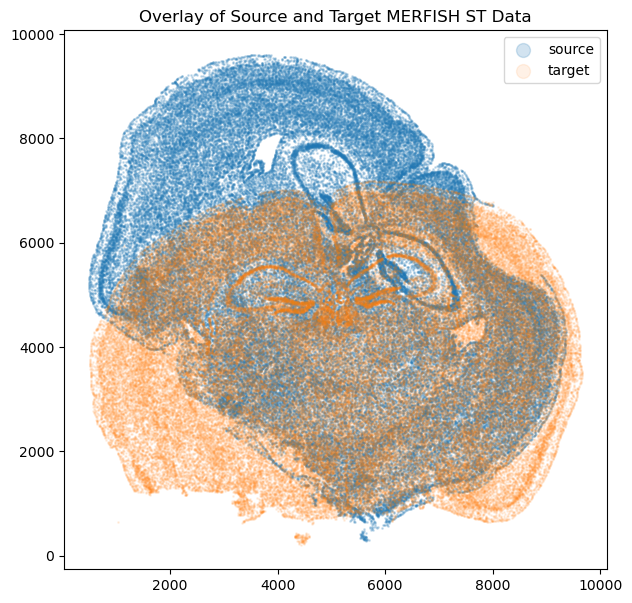

In [8]:
# STalign only needs cell centroid info, pull this 
xI = np.array(source_metadata['center_x'])
yI = np.array(source_metadata['center_y'])

xJ = np.array(target_metadata['center_x'])
yJ = np.array(target_metadata['center_y'])

# Plot 
fig,ax=plt.subplots(figsize=(7,7))
ax.scatter(xI, yI, s=1,alpha=0.2, label='source')
ax.scatter(xJ, yJ, s=1,alpha=0.1, label='target')
ax.legend(markerscale=10)
plt.title("Overlay of Source and Target MERFISH ST Data")

In [9]:
source_ad = ad.AnnData(np.array(source_gexp))
source_ad.var_names = np.array(source_gexp.columns)
source_ad.obs_names = source_gexp.index
source_ad.obsm['spatial'] = np.array([[xI[i], yI[i]] for i in range(len(xI))])

target_ad = ad.AnnData(np.array(target_gexp))
target_ad.var_names = np.array(target_gexp.columns) 
target_ad.obs_names = target_gexp.index 
target_ad.obsm['spatial'] = np.array([[xJ[i], yJ[i]] for i in range(len(xJ))])

In [10]:
#((85958, 649), (84172, 649))
source_ad.shape, target_ad.shape

((84172, 649), (85958, 649))

### 02. Preprocess ST gexp data using Scanpy.

In [11]:
sc.pp.filter_cells(target_ad, min_genes=100)
sc.pp.filter_genes(target_ad, min_cells=3)
sc.pp.filter_cells(source_ad, min_genes=100)
sc.pp.filter_genes(source_ad, min_cells=3)

source_ad.X = source_ad.X.astype(np.float64)
target_ad.X = target_ad.X.astype(np.float64)

sc.pp.normalize_total(source_ad, target_sum=1e4)
sc.pp.log1p(source_ad)

sc.pp.normalize_total(target_ad, target_sum=1e4)
sc.pp.log1p(target_ad)

# calculate highly variable genes (HVGs)
sc.pp.highly_variable_genes(source_ad)
sc.pp.highly_variable_genes(target_ad)

# extract top 500 variable genes for source and target 
genes_tI = np.array(source_ad.var['highly_variable'][source_ad.var['highly_variable']==True][0:500].index.values)
genes_tJ = np.array(target_ad.var['highly_variable'][target_ad.var['highly_variable']==True][0:500].index.values)

# find intersecting highly variable genes (85 total) 
genes_int = np.intersect1d(genes_tI, genes_tJ)

dfI = pd.DataFrame(source_ad.X, columns=source_ad.var.index)
dfJ = pd.DataFrame(target_ad.X, columns=target_ad.var.index)

indicesI = [index for index, value in enumerate(source_ad.var.index) if value in genes_int]
indicesJ = [index for index, value in enumerate(target_ad.var.index) if value in genes_int]

# subsetted dataframe of gene exp data (cells by genes) 
GI = dfI.iloc[:,indicesI]
GJ = dfJ.iloc[:,indicesJ]

# get list of length 2 for x and y coords 
list_I = [source_ad.obsm['spatial'][:,0],source_ad.obsm['spatial'][:,1]]
list_J = [target_ad.obsm['spatial'][:,0],target_ad.obsm['spatial'][:,1]]

### 03. sterize each gene into a 2D image. 
Using the intersecting HVGs from I and J, take the cell x gene matrix 'G' and rasterize each gene column into a smooth 2D image using the `rasterizeByGene()` function. Returns both the 3D raster stack and flattened feature vectors. 

In [12]:
GI.head() # stores the gene expression for each cell (row) by gene (column) 

,Htr5b,Adora3,Adgre4,Adgrf5,Adgrl4,Brs3,Ccr1,Ccr7,Ccr9,Ccrl2,...,Pln,Csf1r,Fgfr4,Flt1,Insrr,Mertk,Musk,Ntrk1,Pdgfrb,Tek
0,0.0,0.0,0.0,4.413599,4.413599,2.85147,0.0,0.0,0.0,0.000000,...,0.0,2.851470,2.85147,4.879050,0.0,4.879050,0.000000,0.0,4.193479,3.515312
1,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000,...,0.0,5.300466,0.00000,0.000000,0.0,4.612296,0.000000,0.0,0.000000,0.000000
2,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
3,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000,...,0.0,4.348158,0.00000,3.667859,0.0,5.034819,0.000000,0.0,4.749304,0.000000
4,0.0,0.0,0.0,5.070860,3.984724,0.00000,0.0,0.0,0.0,3.984724,...,0.0,0.000000,0.00000,5.474231,0.0,4.383971,3.310004,0.0,4.383971,4.383971


Use same parameters as the original STalign framework: 
- dx = 30 
- blur = 1.5 

In [16]:
XgI, YgI, XI, YI = rasterizeByGene(list_I[0], # x coordinates of cells in Dataset I 
                                   list_I[1], # y coordinates of cells in Dataset I
                                   GI, # cell by gene matrix for Dataset I 
                                   dx=30, 
                                   blur=1.5)

0 out of 85 genes rasterized.
10 out of 85 genes rasterized.
20 out of 85 genes rasterized.
30 out of 85 genes rasterized.
40 out of 85 genes rasterized.
50 out of 85 genes rasterized.
60 out of 85 genes rasterized.
70 out of 85 genes rasterized.
80 out of 85 genes rasterized.


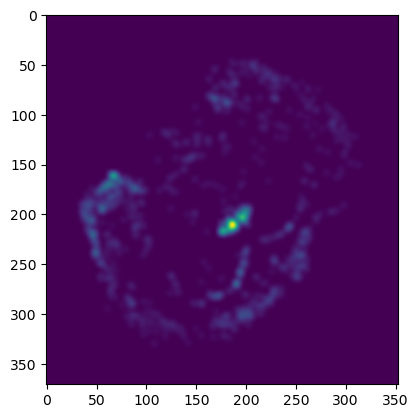

In [20]:
plt.imshow(XgI[0])

In [22]:
YgI.shape # genes by (x * y)

(85, 130963)

In [23]:
XgI[0].shape

(371, 353)

In [24]:
371 * 353

130963

In [33]:
len(XI), len(YI)

(353, 371)

What `rasterizeByGene()` returns: 
- `XgI`: 3D tensor of rasterized gene images
    
    Shape: (n_genes, nrows, ncols) 
    
    The full rasterized spatial gene-expression image stack, where each slice is one gene. 
- `YgI`: flattened, mean-centered version of XgJ 
    
    Shape: (n_genes, nrows * ncols) 

    Same as: YgJ[i] = XgJ[i].ravel() - XgJ[i].mean()
- `XI`: raster grid's X-axis coordinates 
- `YI`: raster grid's Y-axis coordinates 

In [35]:
XgJ, YgJ, XJ, YJ = rasterizeByGene(list_J[0], 
                                   list_J[1], 
                                   GJ, 
                                   dx=30, 
                                   blur=1.5)

0 out of 85 genes rasterized.
10 out of 85 genes rasterized.
20 out of 85 genes rasterized.
30 out of 85 genes rasterized.
40 out of 85 genes rasterized.
50 out of 85 genes rasterized.
60 out of 85 genes rasterized.
70 out of 85 genes rasterized.
80 out of 85 genes rasterized.


In [36]:
len(XJ), len(YJ)

(365, 278)

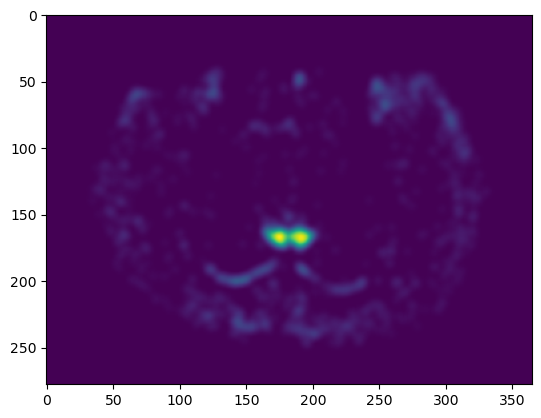

In [43]:
plt.imshow(XgJ[0])

Text(0.5, 1.0, 'Rasterized Target Image, J')

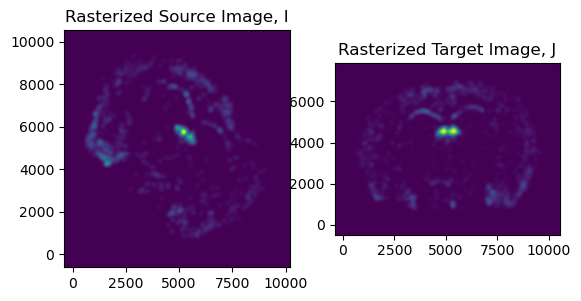

In [44]:
# plot rasterized images next to each other 
# get extent of images 
extentI = STalign.extent_from_x((YI,XI))
extentJ = STalign.extent_from_x((YJ,XJ))

# plot rasterized images 
fig,ax = plt.subplots(1,2)
ax[0].imshow(XgI[0], extent=extentI)
ax[1].imshow(XgJ[0], extent=extentJ)
ax[0].invert_yaxis()
ax[1].invert_yaxis()
ax[0].set_title("Rasterized Source Image, I")
ax[1].set_title("Rasterized Target Image, J")

In [59]:
GI.columns[17]

'Cckar'

In [60]:
GJ.columns == GI.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

0: Htr5b


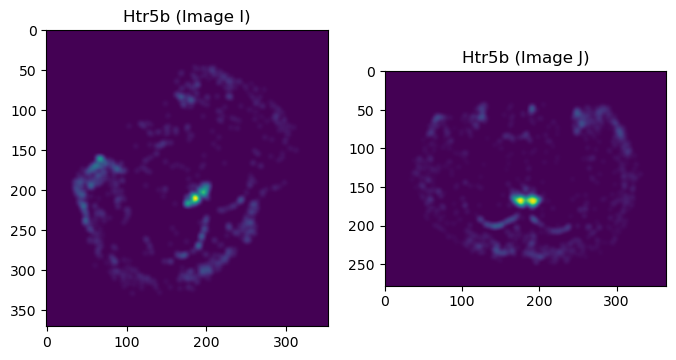

1: Adora3


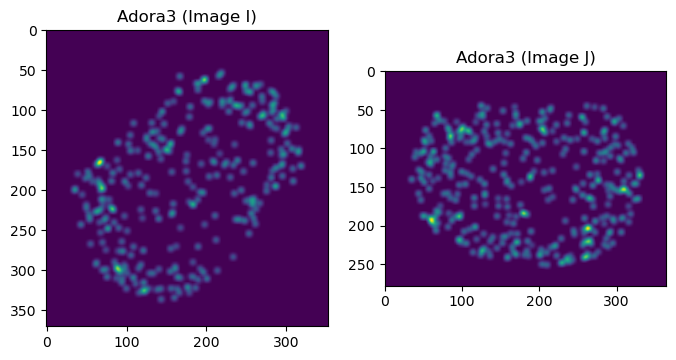

2: Adgre4


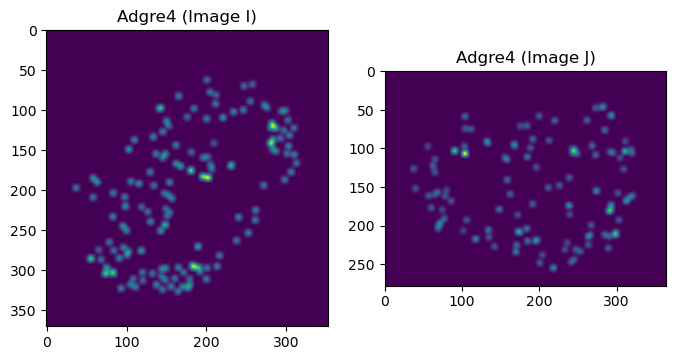

3: Adgrf5


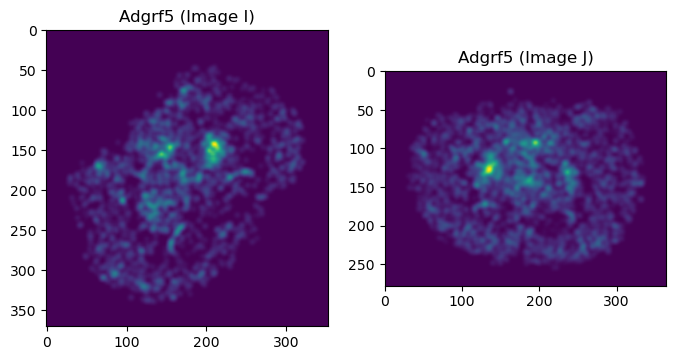

4: Adgrl4


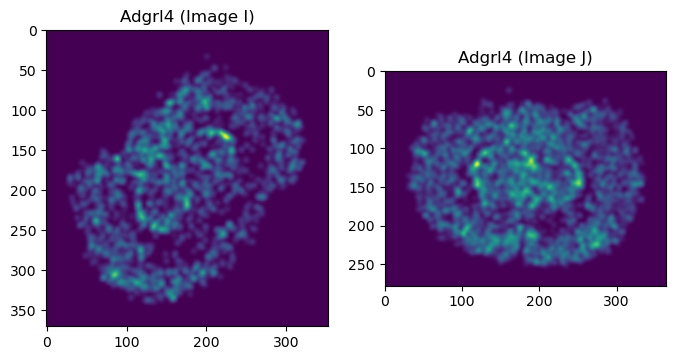

5: Brs3


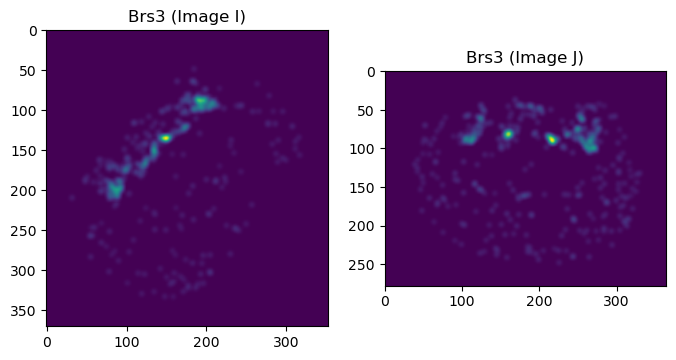

6: Ccr1


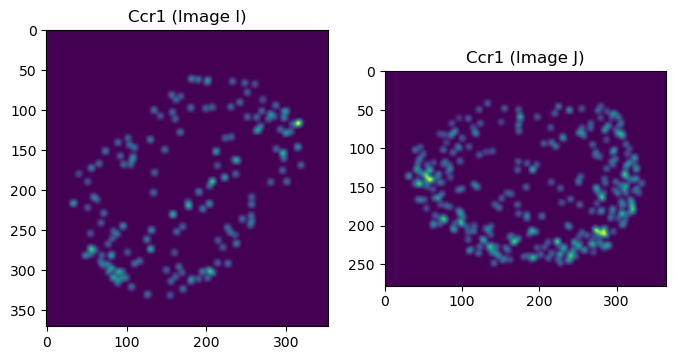

7: Ccr7


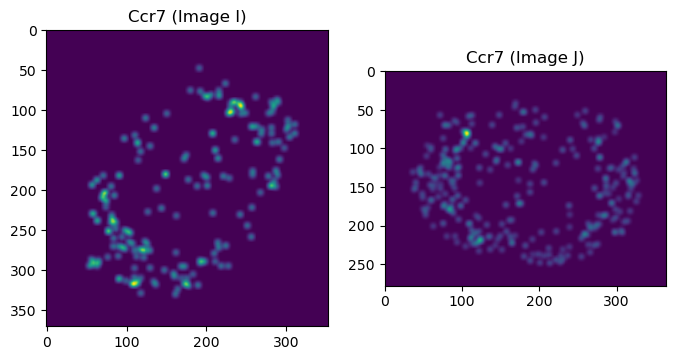

8: Ccr9


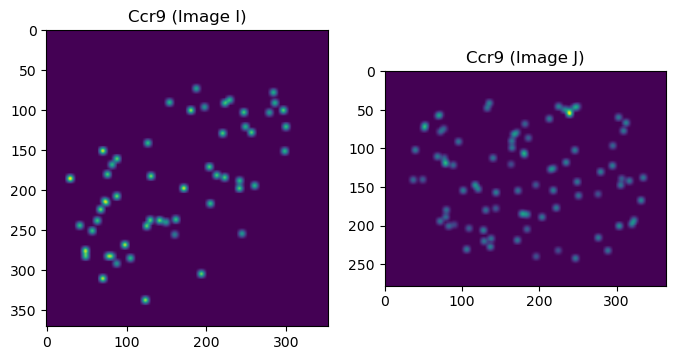

9: Ccrl2


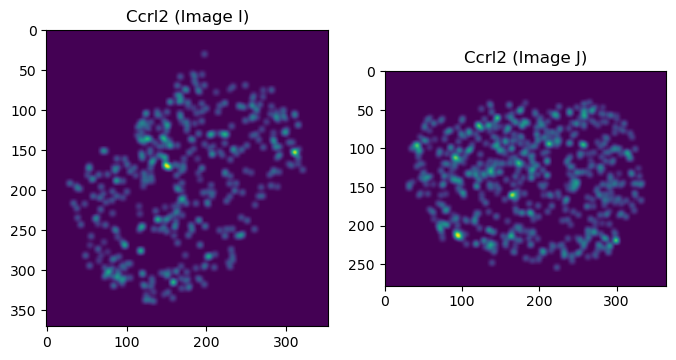

10: Cxcr2


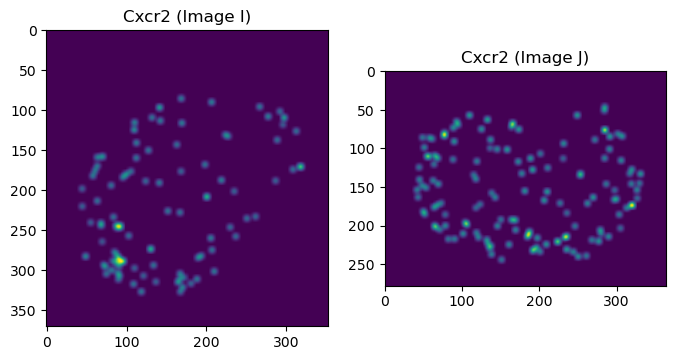

11: Cxcr3


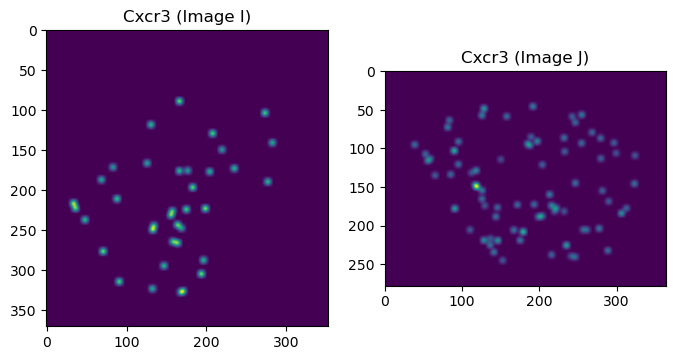

12: Cxcr4


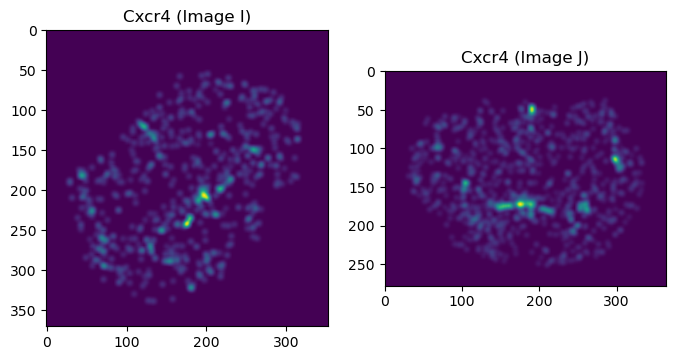

13: Cxcr5


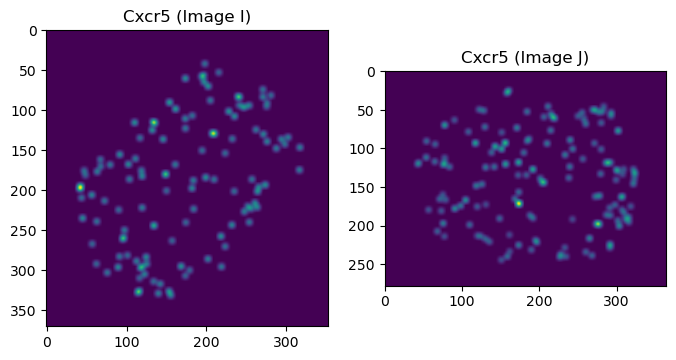

14: Cxcr6


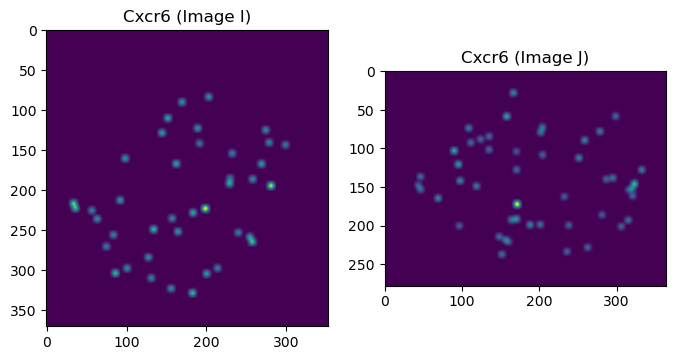

15: C3ar1


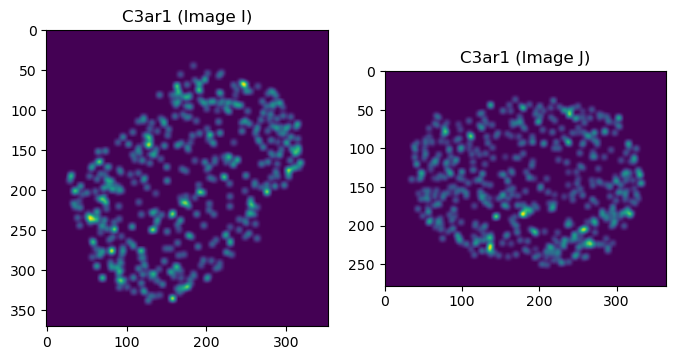

16: Calcr


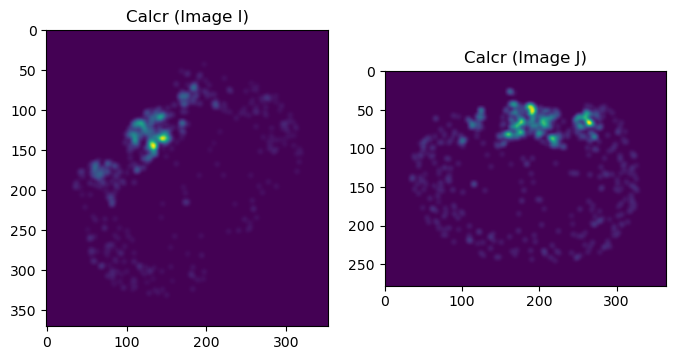

17: Cckar


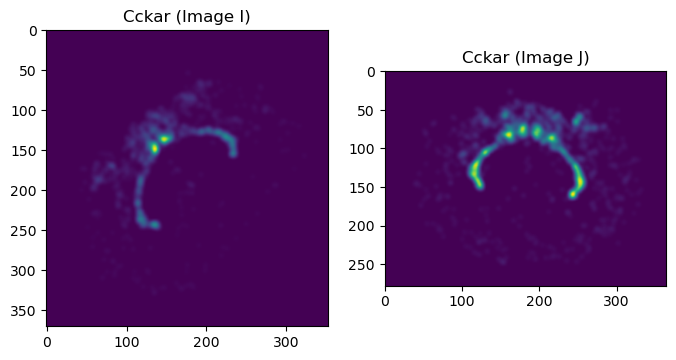

18: Crhr2


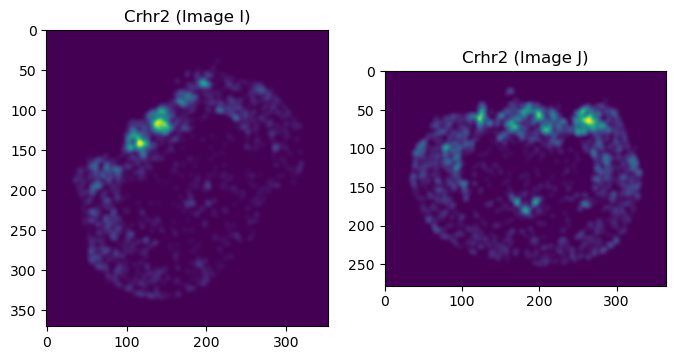

19: Cx3cr1


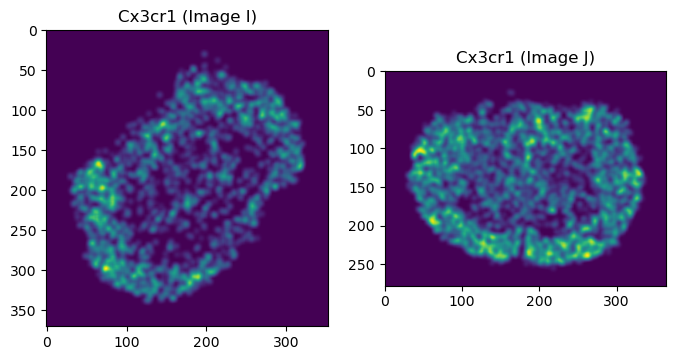

20: Gper1


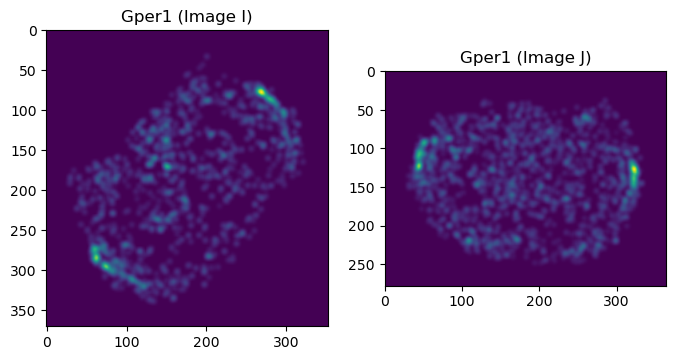

21: Gpr182


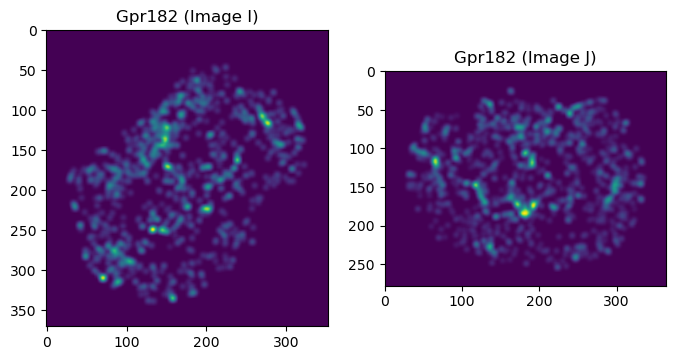

22: Gpr183


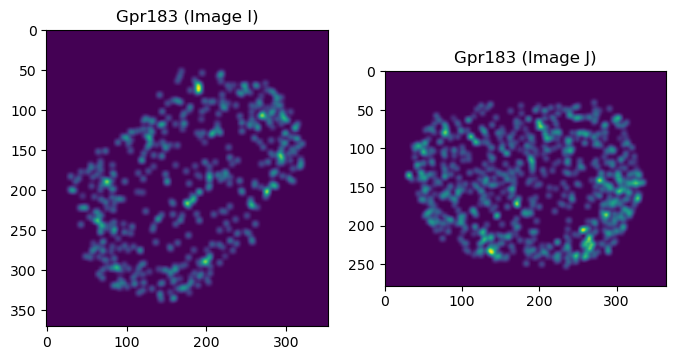

23: Gpr20


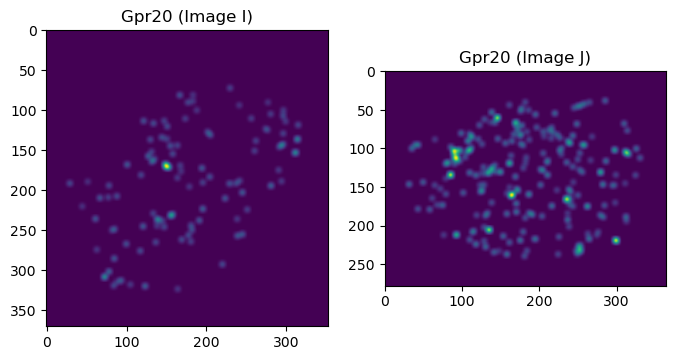

24: Gprc5c


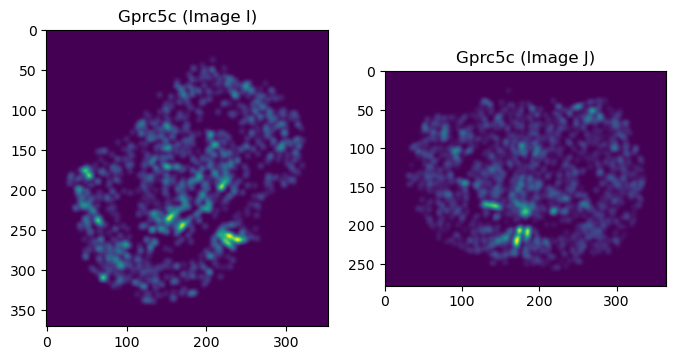

25: Grpr


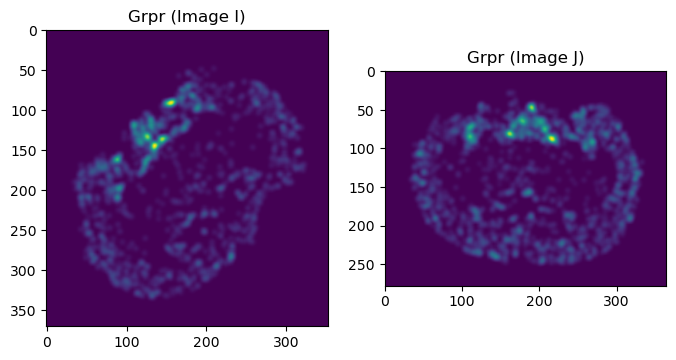

26: Glp1r


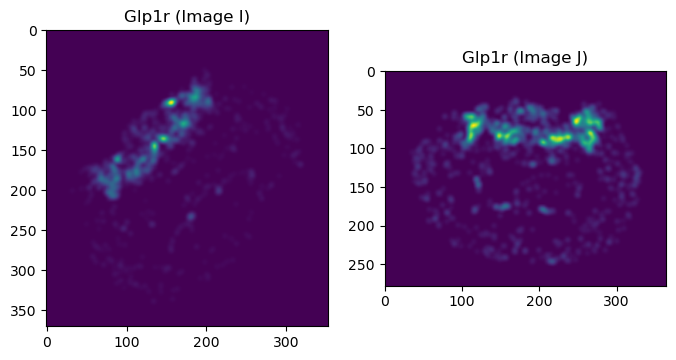

27: Glp2r


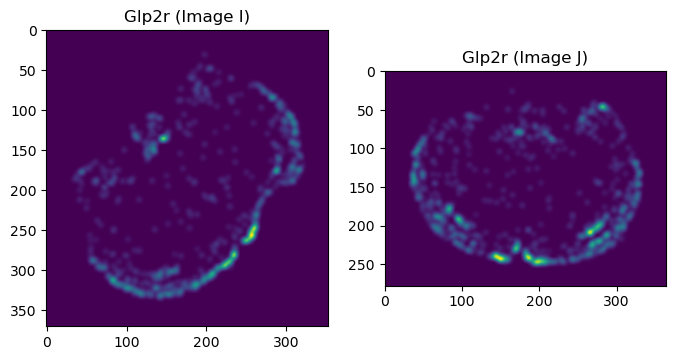

28: Ghsr


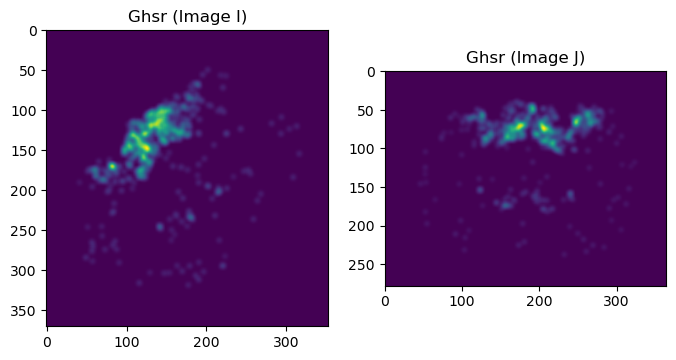

29: Hcar1


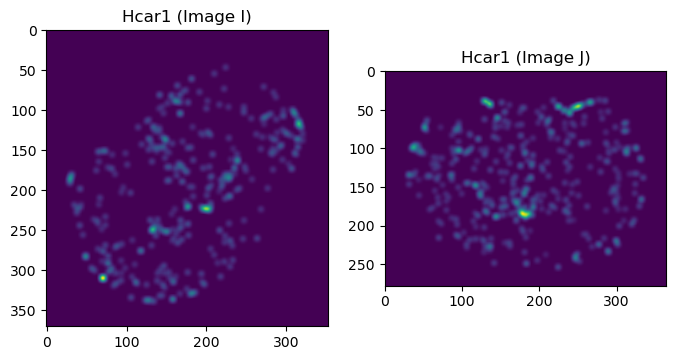

30: Lpar3


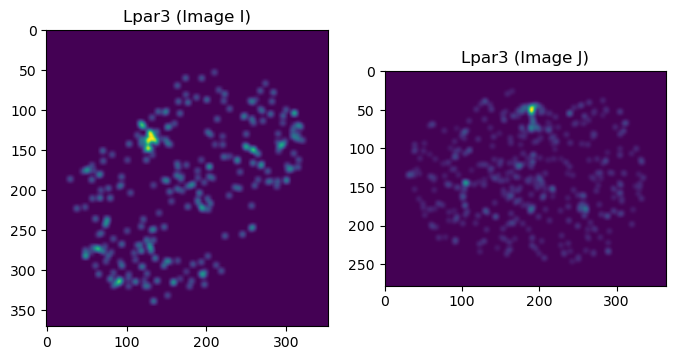

31: Mrgprf


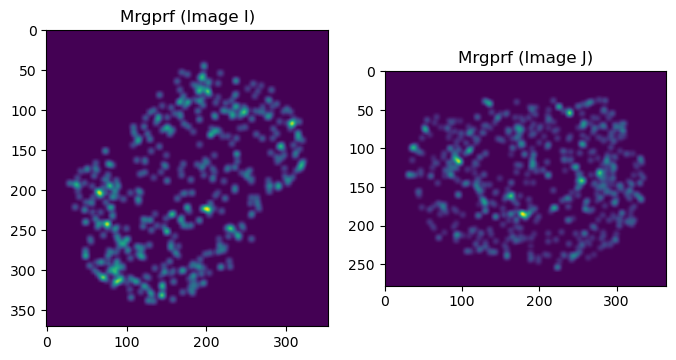

32: Gpr50


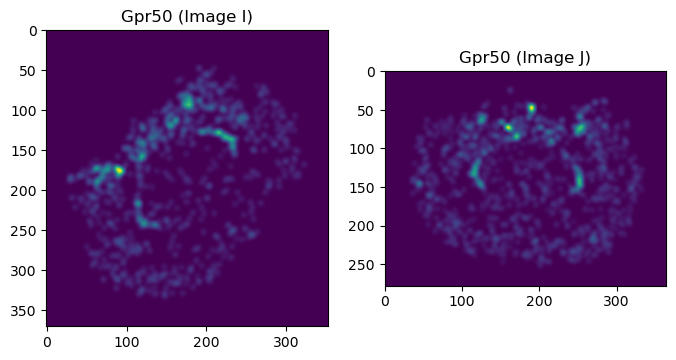

33: Tacr3


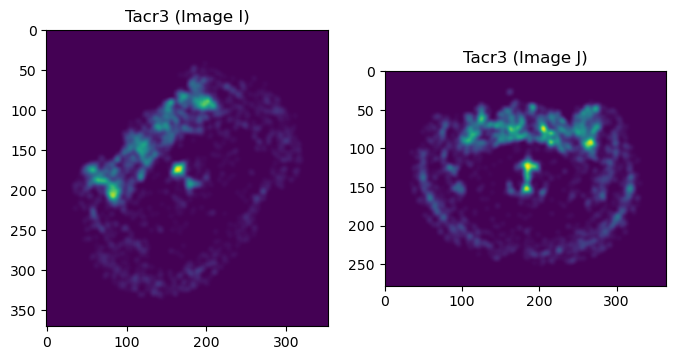

34: Nmur2


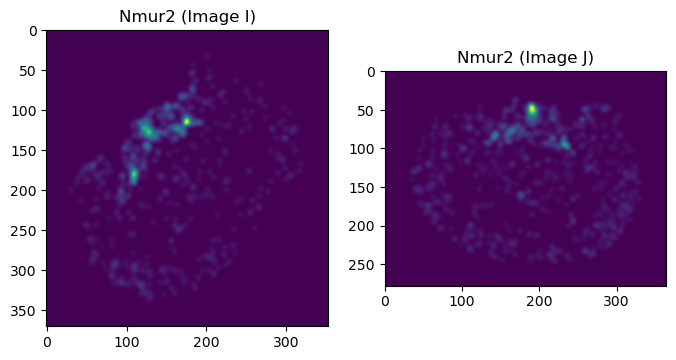

35: Npffr2


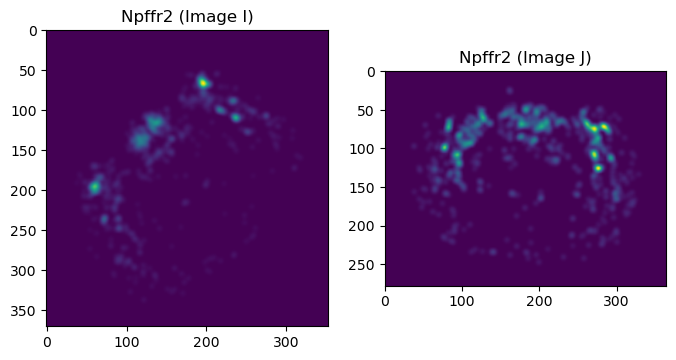

36: Npsr1


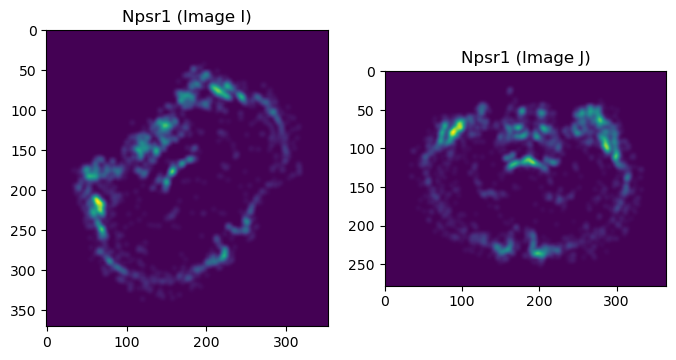

37: Npy2r


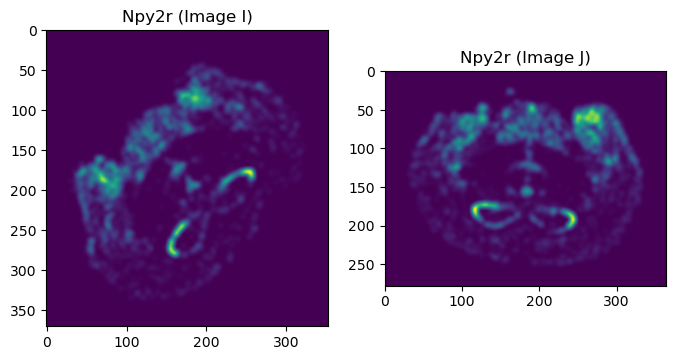

38: Npbwr1


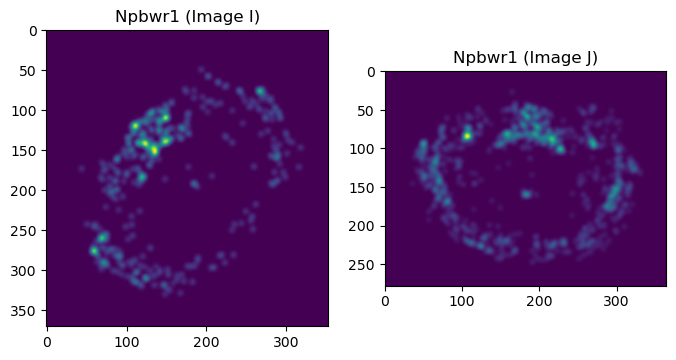

39: Opn5


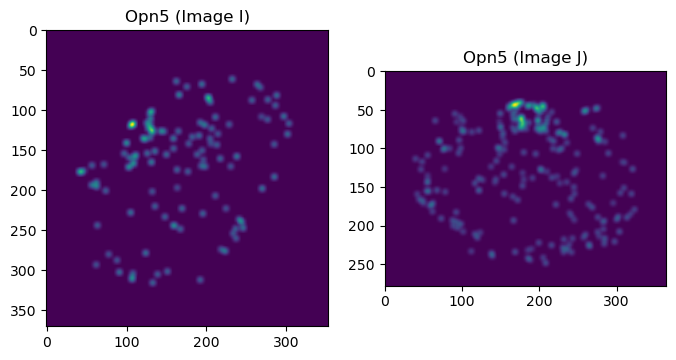

40: P2yr13


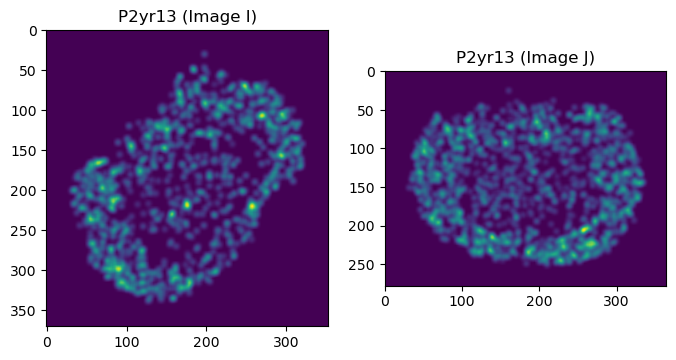

41: Gpr141


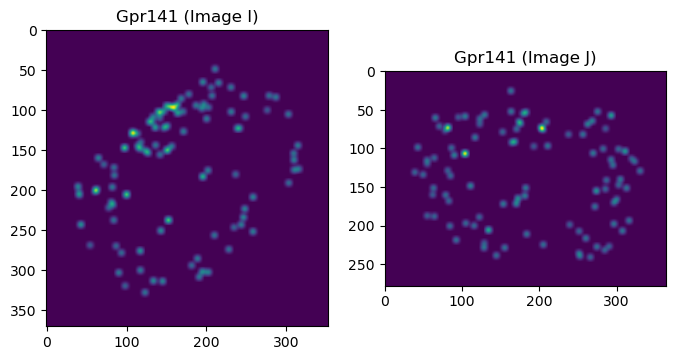

42: Gpr151


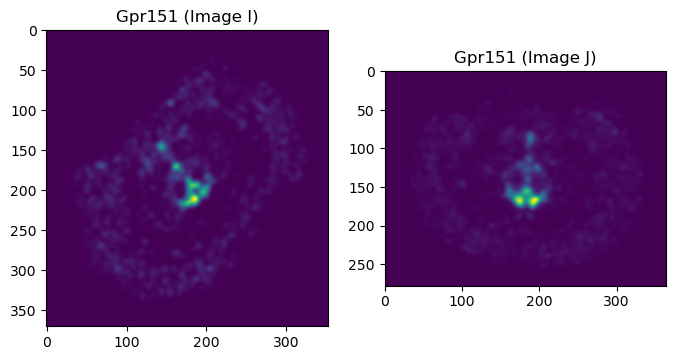

43: Gpr171


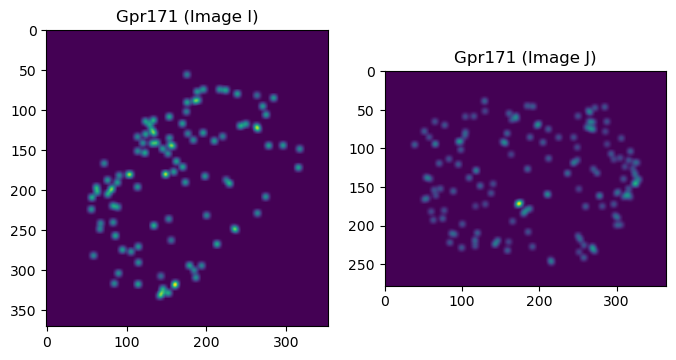

44: Prokr2


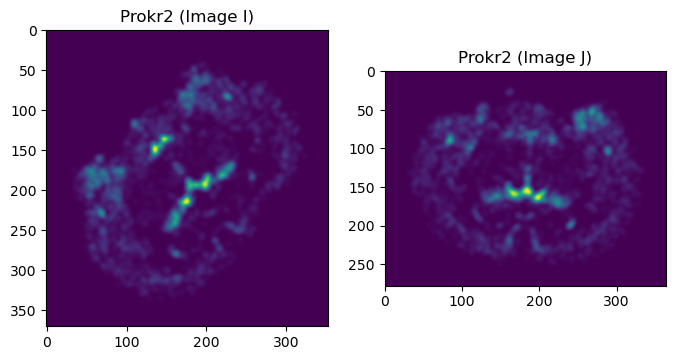

45: Ptgdr


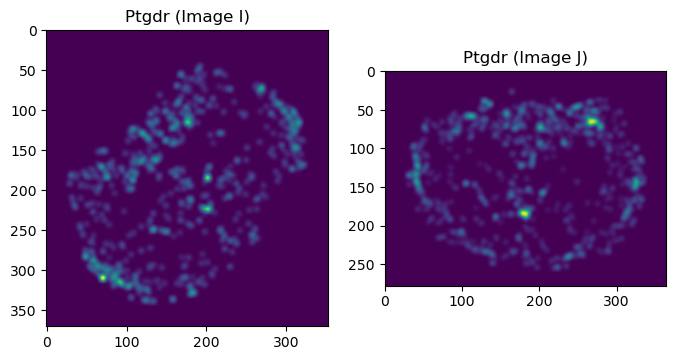

46: Ptger4


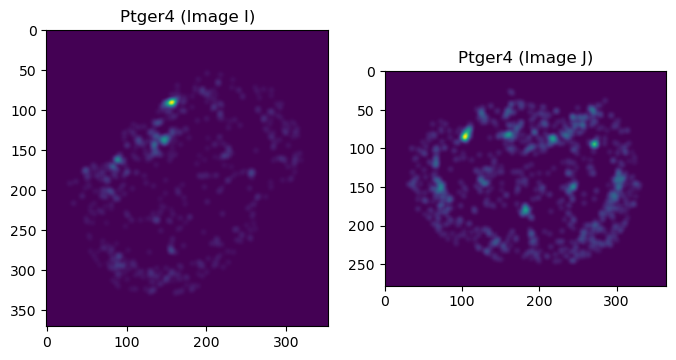

47: Ptgfr


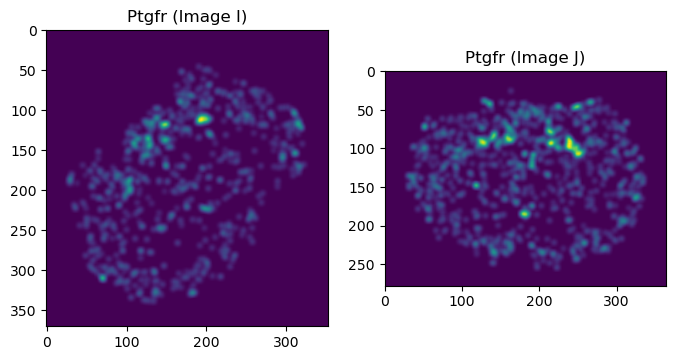

48: F2rl1


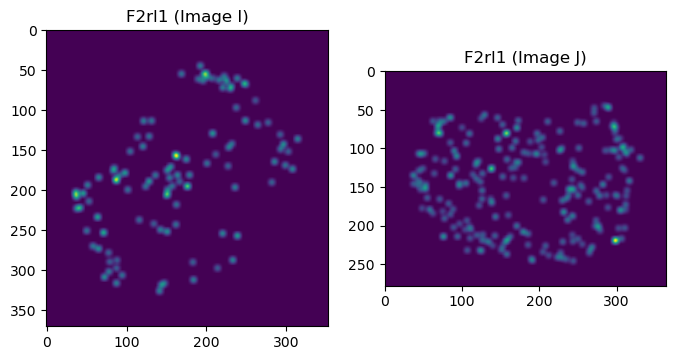

49: Rxfp2


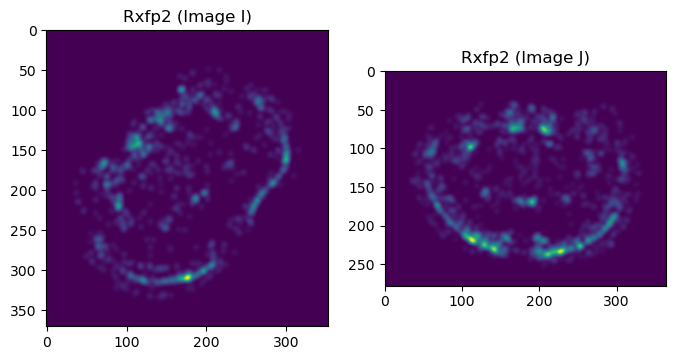

50: Sctr


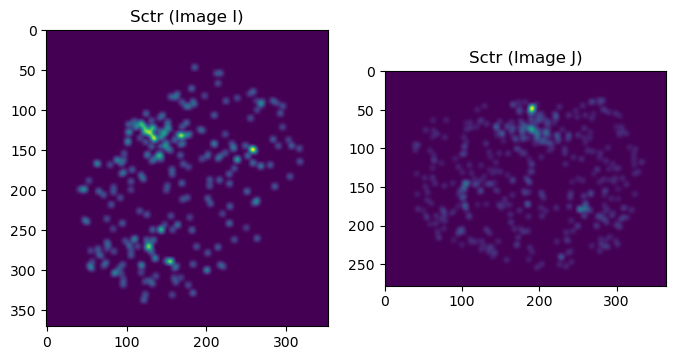

51: Tacr1


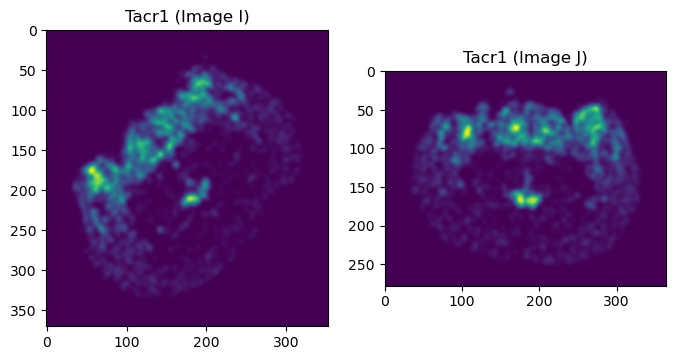

52: Tbxa2r


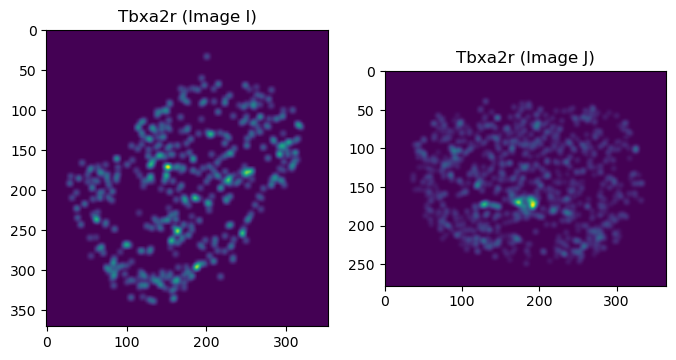

53: Tshr


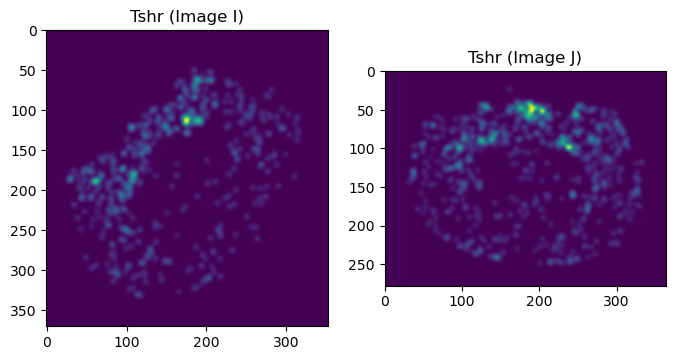

54: Gpr17


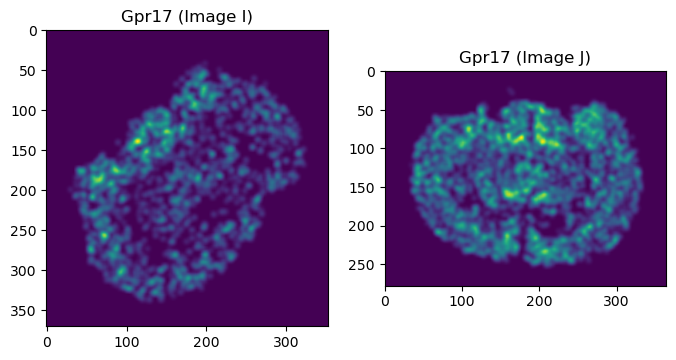

55: Avpr1b


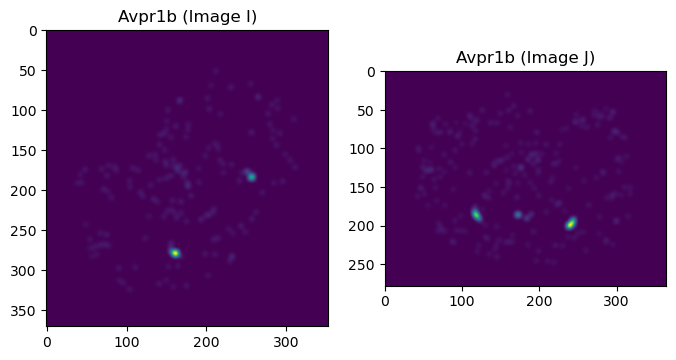

56: Mki67


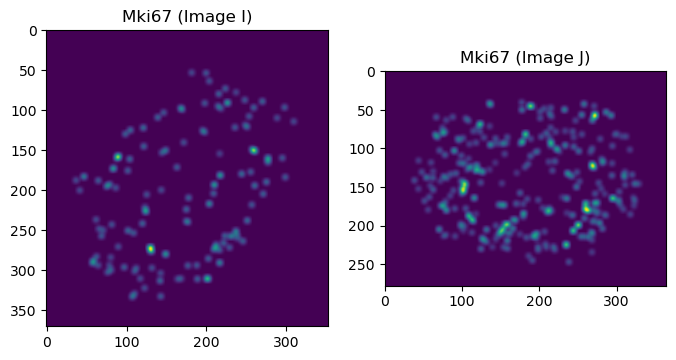

57: Slc17a8


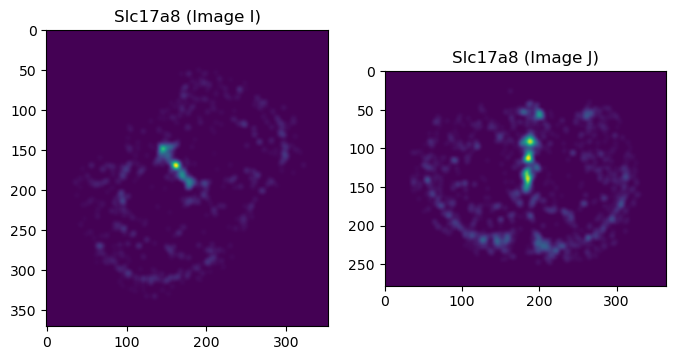

58: Aqp4


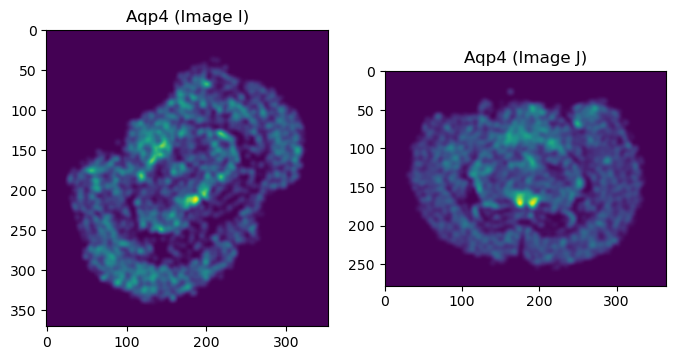

59: Selplg


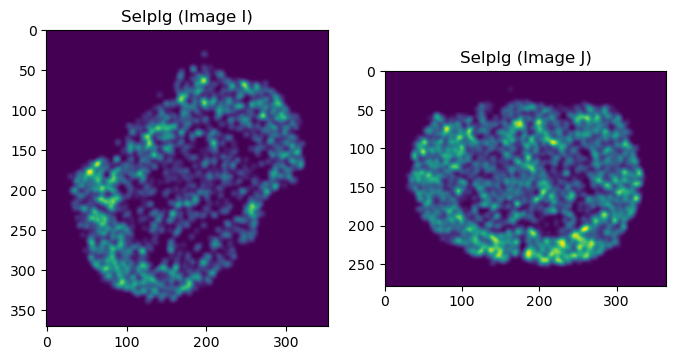

60: Slco1a4


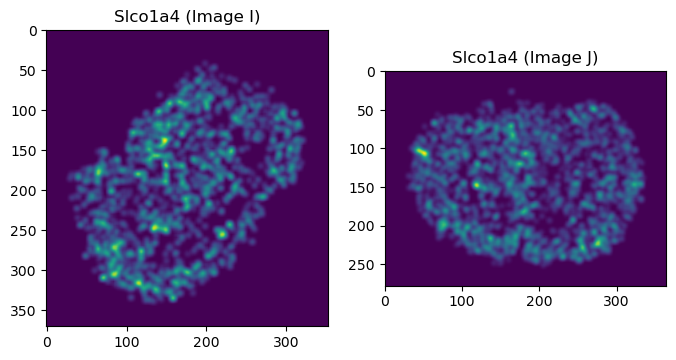

61: Fn1


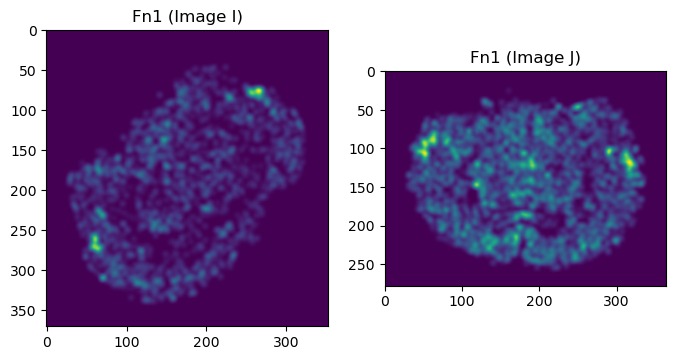

62: Cldn5


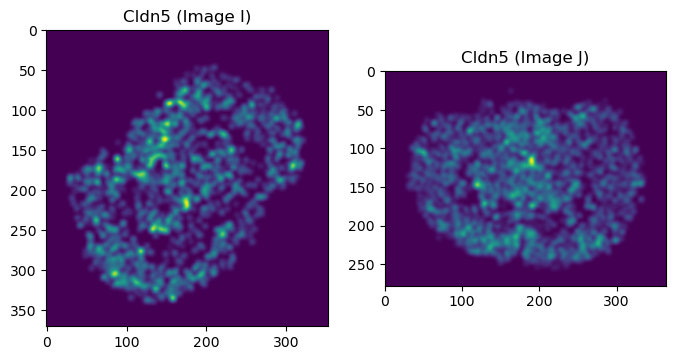

63: Myh11


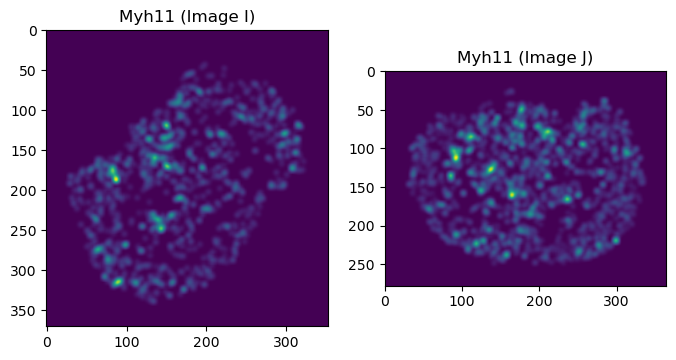

64: Lmod1


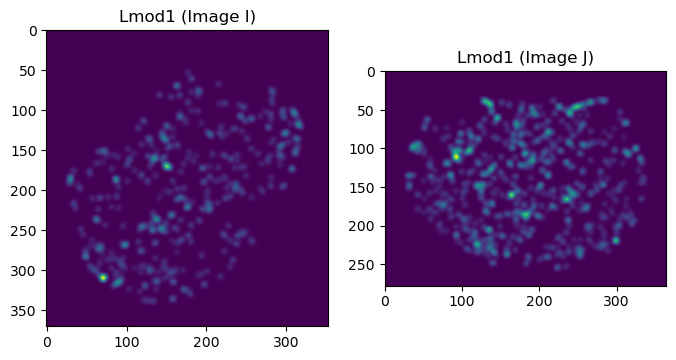

65: Atp13a5


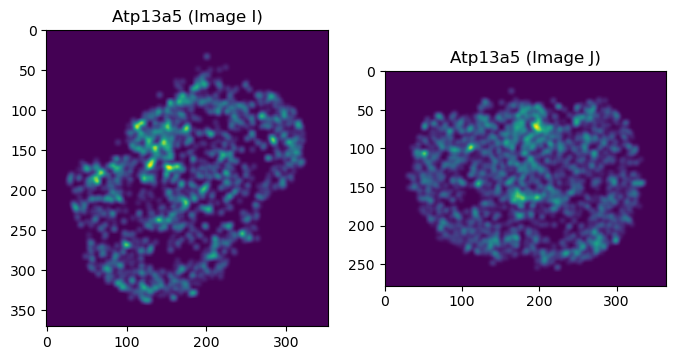

66: Abcc9


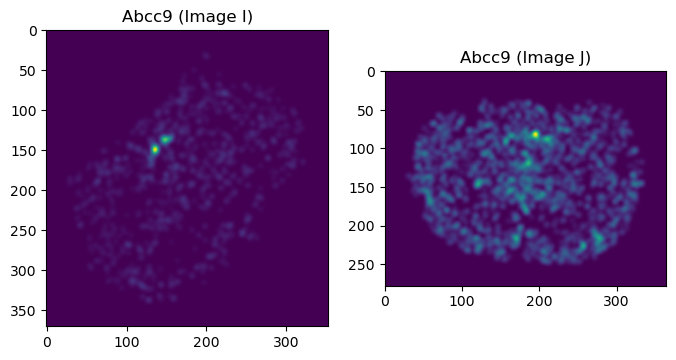

67: C1qa


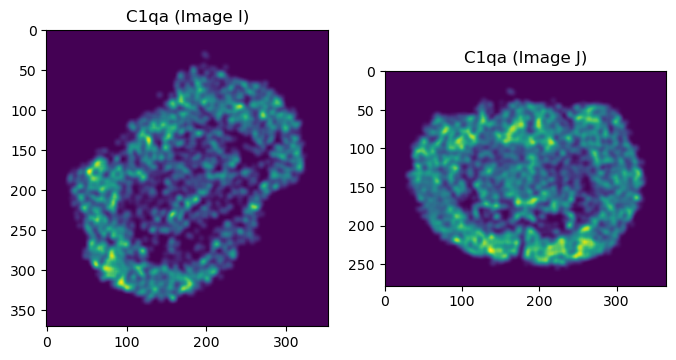

68: C1qb


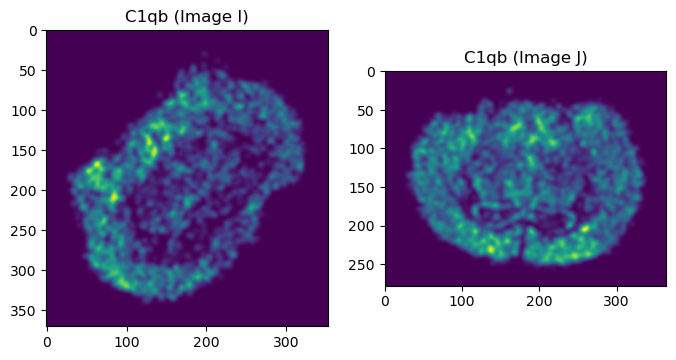

69: Chat


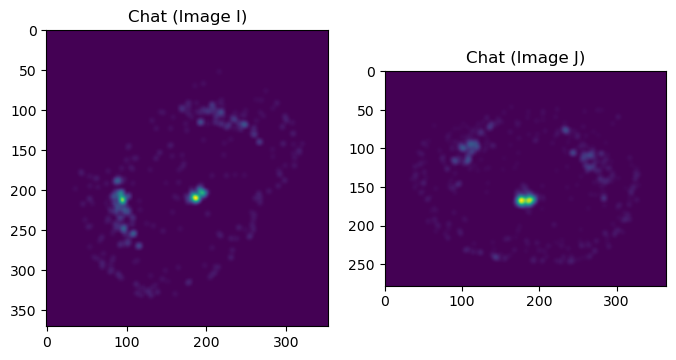

70: Igfbpl1


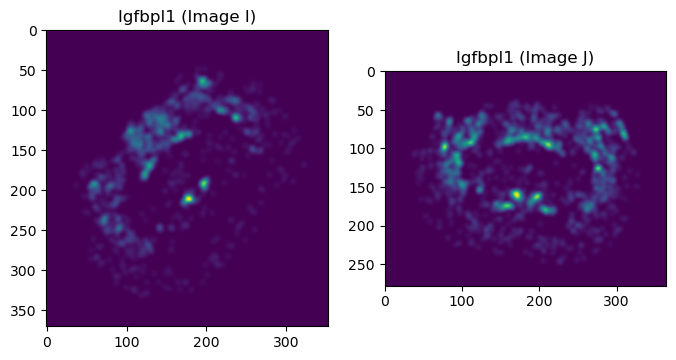

71: Eomes


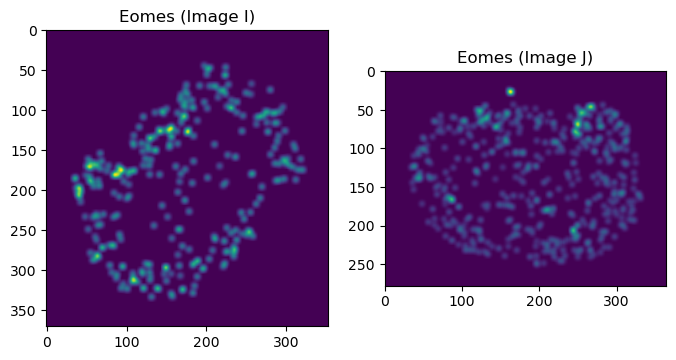

72: Th


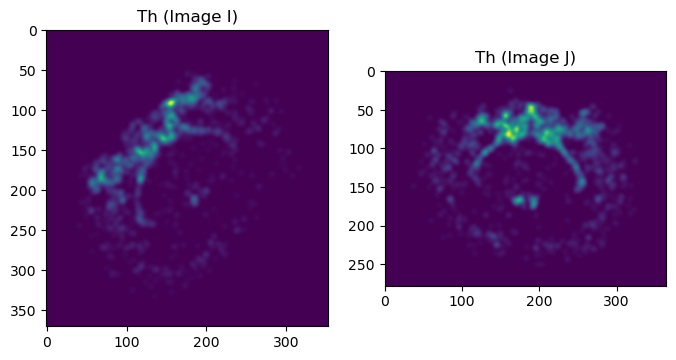

73: Top2a


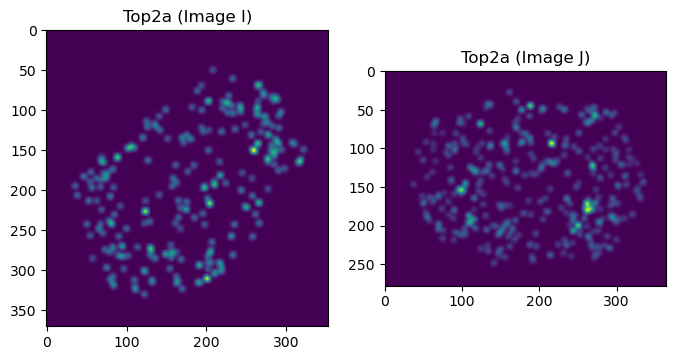

74: Slc47a1


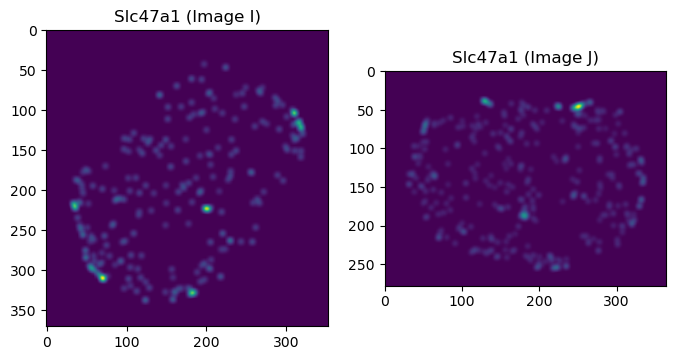

75: Pln


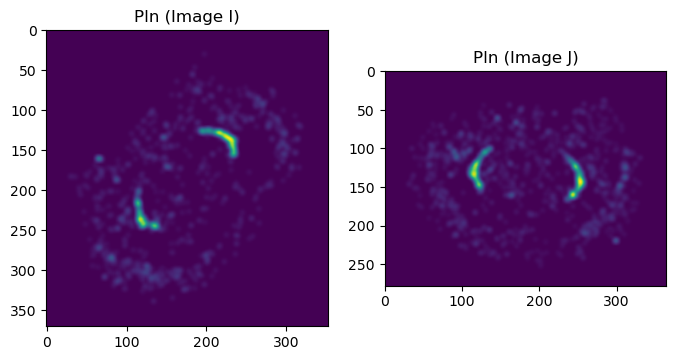

76: Csf1r


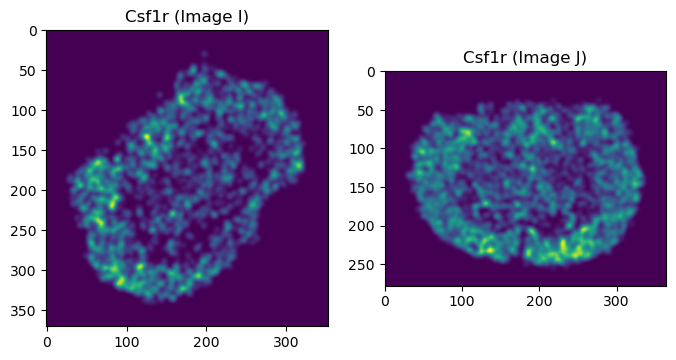

77: Fgfr4


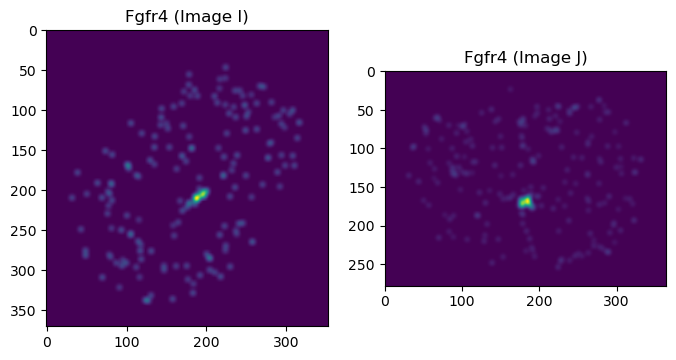

78: Flt1


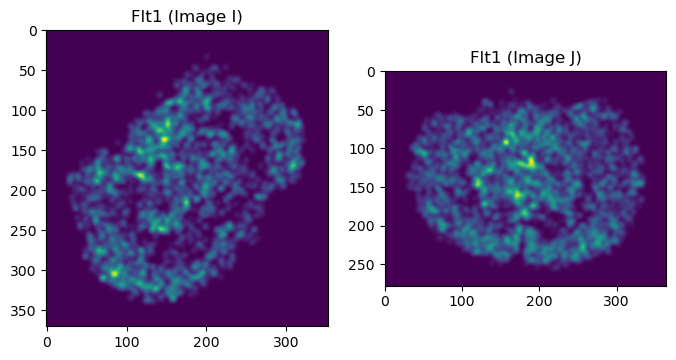

79: Insrr


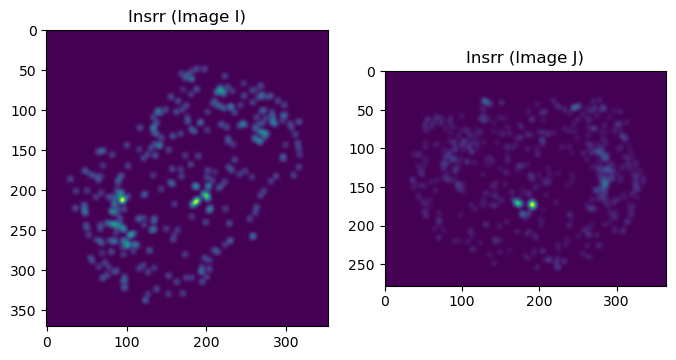

80: Mertk


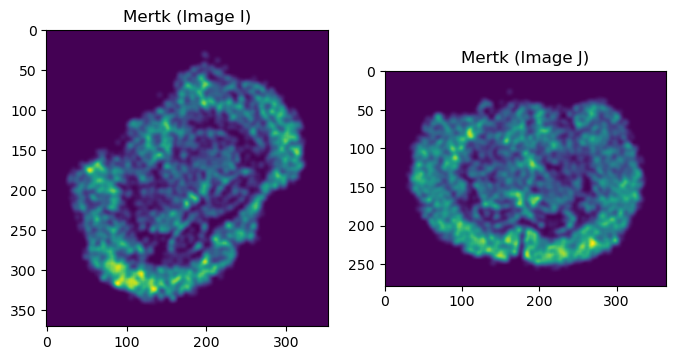

81: Musk


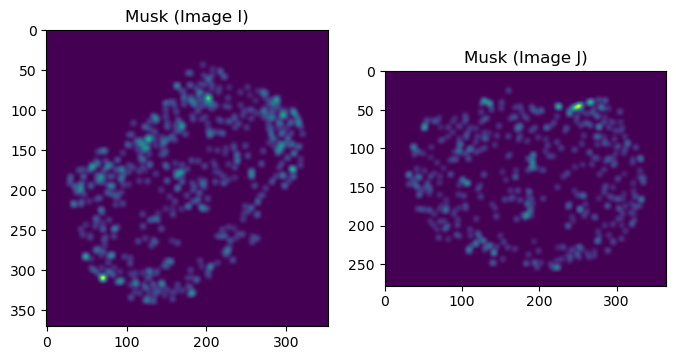

82: Ntrk1


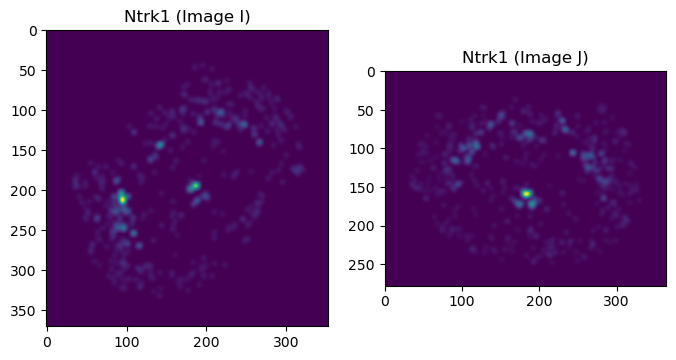

83: Pdgfrb


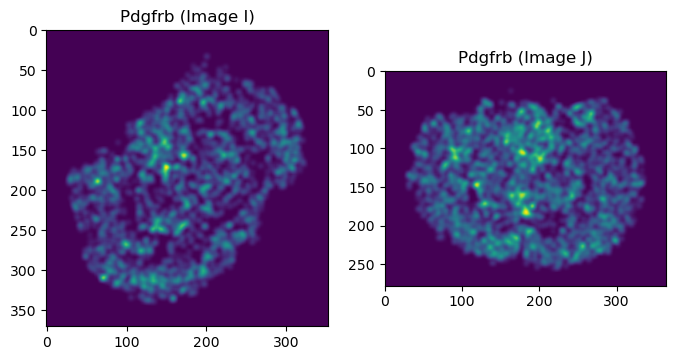

84: Tek


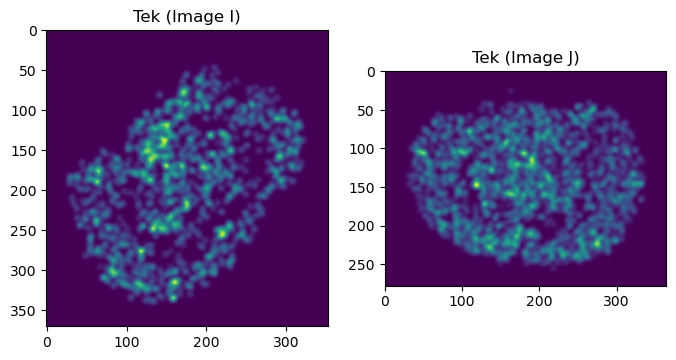

In [61]:
gene_names = GI.columns  # or GJ.columns; they should match

n_genes = len(XgI)

for i in range(n_genes):
    print(f"{i}: {gene_names[i]}")
    
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].imshow(XgI[i])
    ax[0].set_title(f"{gene_names[i]} (Image I)")
    
    ax[1].imshow(XgJ[i])
    ax[1].set_title(f"{gene_names[i]} (Image J)")
    
    plt.show()

In [47]:
genes_int[17]

'Ccrl2'

In [50]:
genes_tI[17]

'Celsr1'

/var/folders/jc/r13c712s6dj2g5bnkv832wk40000gn/T/ipykernel_96489/1007141319.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(source_ad, color='Gpr151', spot_size=75)


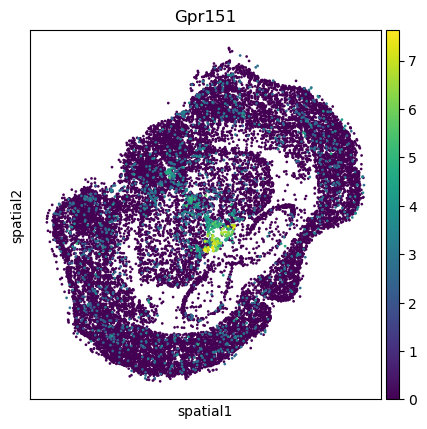

In [62]:
sc.pl.spatial(source_ad, color='Gpr151', spot_size=75)

In [64]:
gene_candidates = [17, 27, 33, 37, 42, 44, 49, 51, 54, 58, 75, 80]

17: Cckar


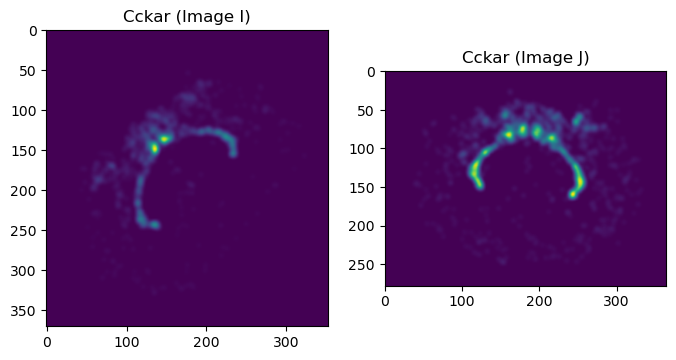

27: Glp2r


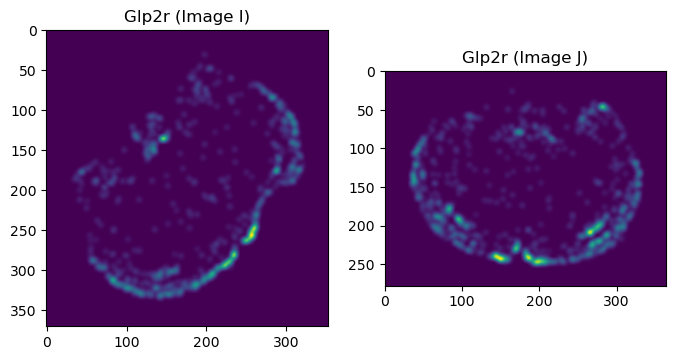

33: Tacr3


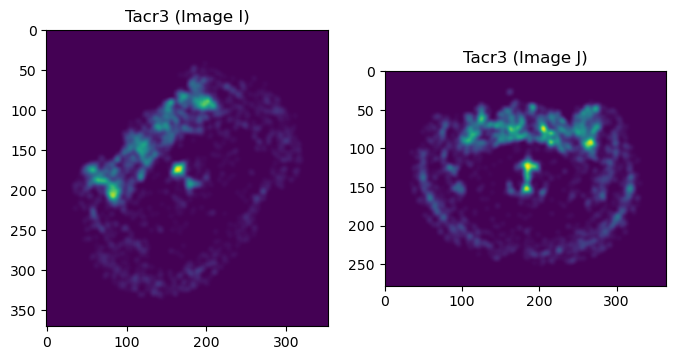

37: Npy2r


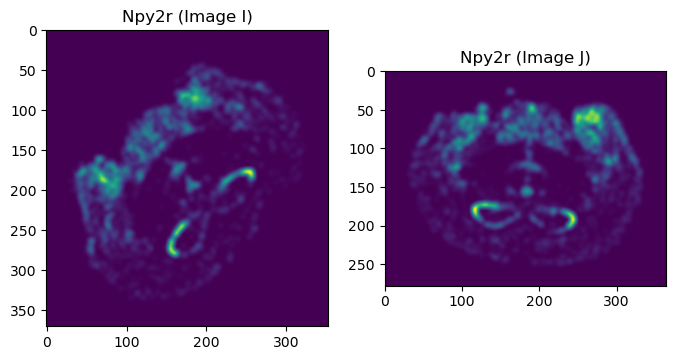

42: Gpr151


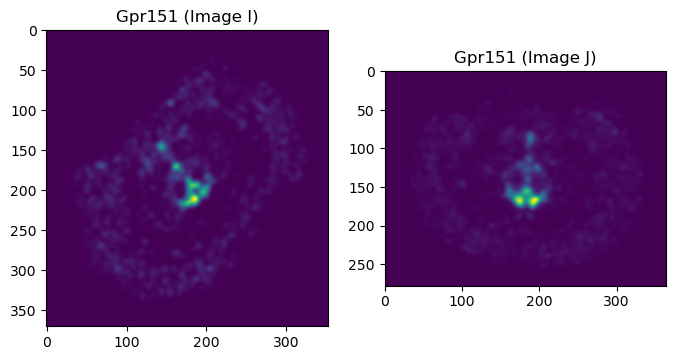

44: Prokr2


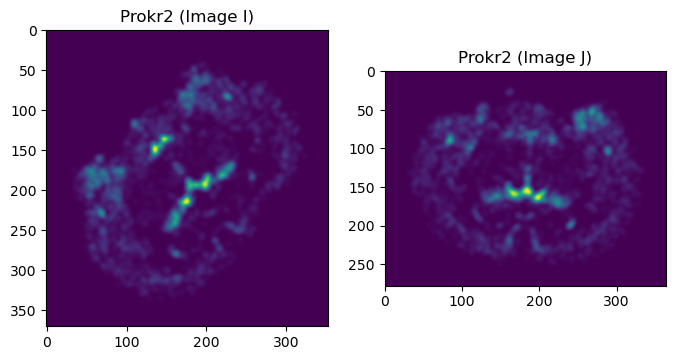

49: Rxfp2


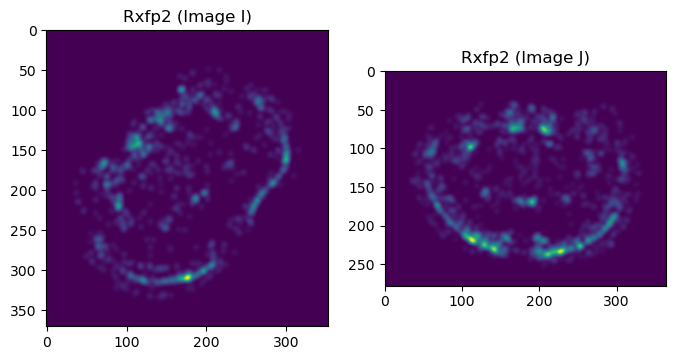

51: Tacr1


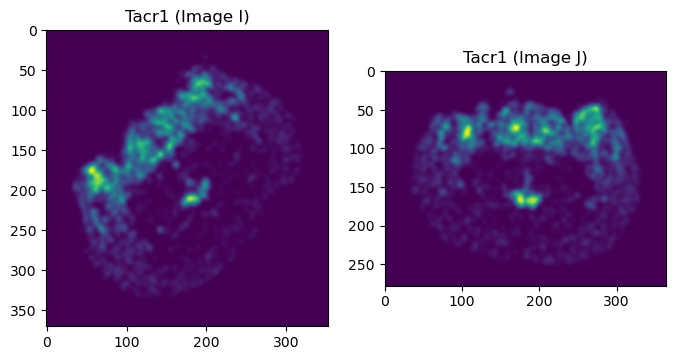

54: Gpr17


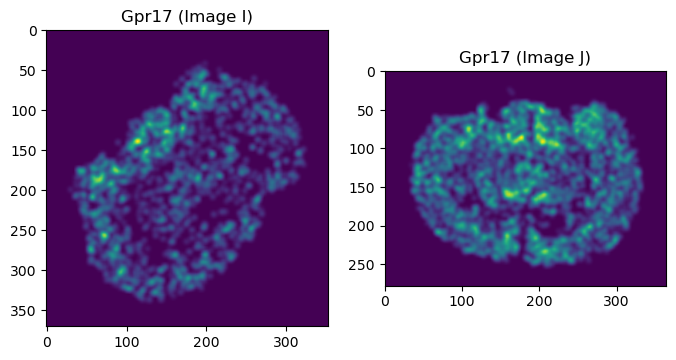

58: Aqp4


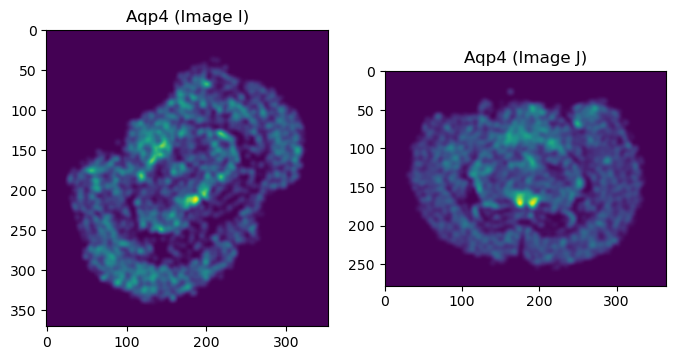

75: Pln


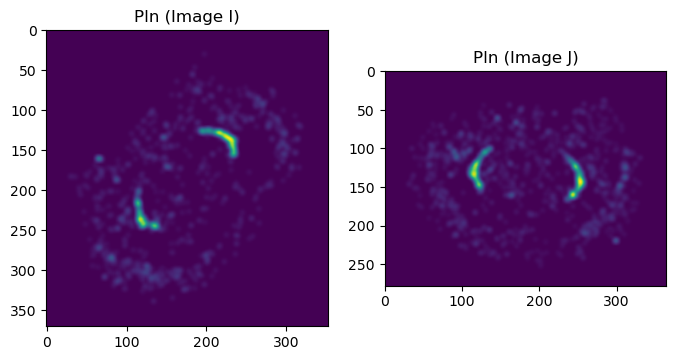

80: Mertk


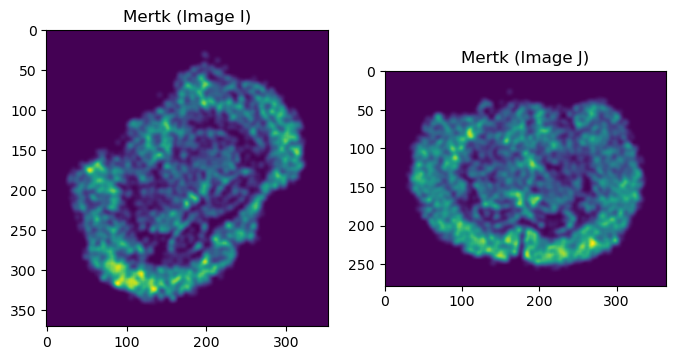

In [65]:
for i in gene_candidates:
    print(f"{i}: {gene_names[i]}")
    
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].imshow(XgI[i])
    ax[0].set_title(f"{gene_names[i]} (Image I)")
    
    ax[1].imshow(XgJ[i])
    ax[1].set_title(f"{gene_names[i]} (Image J)")
    
    plt.show()